# Working with Picasso Localization data

This file contains the code and the corresponding description for filtering and analyzing DNA-PAINT data, which was obtained by running  the localization and fitting algorithms of the $\textit{Localize}$ program of the $\textit{Picasso}$ software on camera data. The camera data was obtained via the DNA-PAINT method. The theory behind this method and a description of the Picasso software is given in "Using DNA-PAINT and the Picasso Software to image Carbon Nano Tube Structures (Wiesner, 2024)". The reader is advised to read that document first, before studying this notebook.
The data, which consists of a stack of frames, each containing estimated positions of the fluorescent molecules of the imager strands attached to corresponding docking strands, will in the following be referred to as $\textit{Localization data}$ or simply $\textit{Localizations}$.

The goal of the following code is to analyze and filter localization data to obtain information on functionalization statistics (i.e., how the docking strands are attached to the nano tubes). After the filtering process, the code attempts to create an image of the nano tube strcture.
The code uses the common python libraries for data analysis, i.e. NumPy, Pandas, Matplotlib, Seaborn, etc.   

Note that the $\textit{Filter}$ program of the Picasso software already contains basic methods for analysis such as displaying localization data in tabular form, creating basic histograms and filtering data by setting boundaries (i.e. max and min values).     
Additionaly, Picassos' $\textit{Render}$ program offers a convenient way for imaging the localization data via a 2D scatterplot with additional contrast representation (this contrast is proportional to the photon count of a localization).   

The following is therefore supposed to serve as an extension and an example on how to work with Picasso's localization data outside of the Picasso program itself. 

**It is necessary to read the attached document "Using DNA-PAINT and the Picasso Software to image Carbon Nanotube Structures" first to fully understand the steps of this script!**.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
import os.path as _ospath
import time
import math
import warnings

In [2]:
warnings.filterwarnings("ignore")

The following script is divided into 4 parts.    

The first section imports the localization data, i.e. the hdf5 file, from your specified path and provides basic descriptive statistics on the data. It also visualizes the distributions of important parameters.    

The second section filters the data with respect to certain parameters.

The third section shows how it is possible to create an image from the localization data yourself without using the Render program from Picasso.

The fourth section explains how you can export the filtered data, so that an image can be created using in the Render program.   
The images from section 3 and 4 are then compared and the functionalisation density of the imaged Carbon Nano Tubes is calculated.

## 1. Importing Localization Data and providing Basic Descriptive Statistics

$$ \textbf{Submit the path to your localization data (i.e. the hdf5 file created by Picasso's Localization program) into the locs_path variable.}$$   


In [3]:
locs_path = "C:/Users/mariu/Desktop/Prozessiert/Dataset_1/Whole_Grid/20211122_Nanotubes_1a_MLE_ibidi_grid50_A_K1_1nM_50p_100mW_100ms_642_01_480x480x_40k_locs.hdf5"

(Note: Running the whole script top to bottom may take around 7-10 minutes, depending on your machine's specifications.)

The following code snippet provides basic descriptional statistics:

In [4]:
# Loading localization data
locs = pd.read_hdf(locs_path, key="locs")
# Data frame size
print("The submitted data contains " + str(locs.shape[0]) + " localizations with " + str(locs.shape[1]) + " parameters each.\n")
# Camera frames
frames = locs["frame"].nunique()
print("The camera collected the data over " + str(frames) + " frames.")
# Grid size
minX = locs["x"].min()
maxX = locs["x"].max()
xRange = maxX - minX

minY = locs["y"].min()
maxY = locs["y"].max()
yRange = maxY - minY

print("The data spans over a " + str(math.ceil(xRange)) + " * " + str(math.ceil(yRange)) + " (camera-) pixel wide grid.")

# minimum net_Gradient
minNetGradient = locs["net_gradient"].min()
print("The minimum net Gradient of the data was set to: " + str(math.floor(minNetGradient)))

print("The first 5 localization entries are: ")
locs.head(5)

The submitted data contains 3506384 localizations with 11 parameters each.

The camera collected the data over 40000 frames.
The data spans over a 479 * 479 (camera-) pixel wide grid.
The minimum net Gradient of the data was set to: 3000
The first 5 localization entries are: 


,frame,x,y,photons,sx,sy,bg,lpx,lpy,ellipticity,net_gradient
0,0,3.094456,194.757233,33591.265625,1.728273,1.309706,602.940613,0.011708,0.015935,0.242188,43365.625000
1,0,3.889416,460.967987,8376.607422,0.946634,1.081521,618.686340,0.023262,0.020571,0.124719,17813.750000
2,0,3.986240,83.065071,8381.339844,0.906434,0.995318,652.147034,0.021125,0.019384,0.089302,18324.687500
3,0,4.210280,273.497833,3442.982666,1.026517,1.100933,558.925903,0.049899,0.046769,0.067594,6202.302246
4,0,4.668493,286.836945,2473.141846,1.071678,1.577189,558.838318,0.114585,0.076994,0.320514,4104.476562


(Note that each row represents a localization. **A "localization" is simply the estimated position of the fluorophore generated from the fluorophores point spread function!**)    
The complete table can be viewed conveniently via the Picasso Filter program.

Summary statistics of the point spread $\textit{sx, sy}$ of the localizations (i.e. the width in x and y direction of the spot):

In [5]:
coloumnsToDescribe = locs[["sx","sy"]]
pd.options.display.float_format = '{:.2}'.format
result = coloumnsToDescribe.describe()
result.drop(index = "count", inplace = True)
print(result)

        sx    sy
mean   1.2   1.2
std    2.2   1.7
min   0.01  0.01
25%    1.1   1.1
50%    1.1   1.2
75%    1.3   1.3
max  4e+02 4e+02


Negative values make no physical scence and should therefore be omitted.

In [6]:
locs = locs[locs['sx'] >= 0]
locs = locs[locs['sy'] >= 0]

In [7]:
# Setting the plot style
sns.set_theme(style="whitegrid", palette = "pastel", context = "paper", font = "serif") 

Distributions of the photon counts and the net Gradient.     
The photon count shows the distribution of the intensity of the spots:

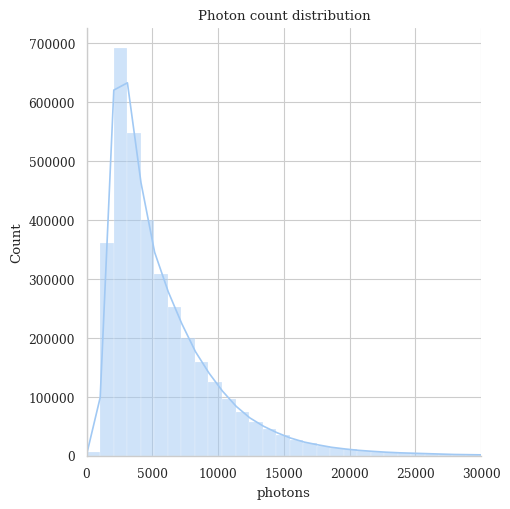

In [8]:
sns.displot(locs.photons.dropna(), kde=True, kde_kws={'bw_adjust':1.5}, rug=False, kind='hist', bins=200)

plt.title("Photon count distribution")
plt.xlim(0,30000)

plt.show()

The net Gradient was used to filter out noise (i.e. blinking events that are caused by diffusing strands. See the presentation for more information on the net Gradient):

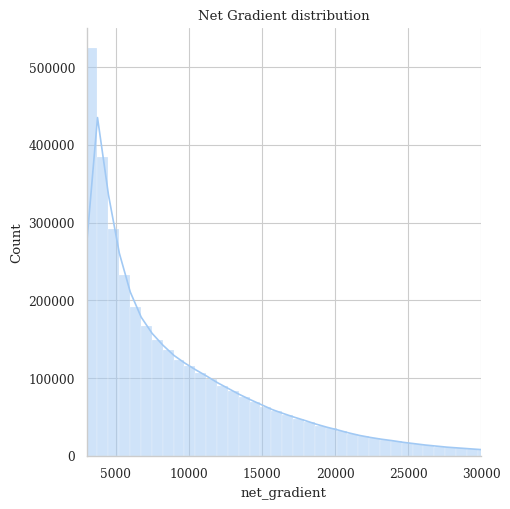

In [9]:
sns.displot(locs.net_gradient.dropna(), kde=True, kde_kws={'bw_adjust':1}, rug=False, kind='hist', bins=200)
sns.kdeplot()
plt.title("Net Gradient distribution")
plt.xlim(locs["net_gradient"].min(),30000)

plt.show()

Summary statistics of photon count and net Gradient:

In [10]:
coloumnsToDescribe = locs[["photons","net_gradient"]]
pd.options.display.float_format = '{:.2f}'.format
result = coloumnsToDescribe.describe()
result.drop(index = "count", inplace = True)
print(result)

       photons  net_gradient
mean   5860.59       9852.74
std    4517.78       7608.75
min       1.00       3000.00
25%    2804.37       4417.50
50%    4458.45       7279.15
75%    7489.49      12807.91
max  205829.56     151722.50


Just as with the point spread values, negative photon count values indicate biased values and should be omitted:

In [11]:
locs = locs[locs['photons'] >= 0]

Both photon count and net gradient show a poisson distribution which shouldn't be surprising regarding the phenomenon of photon noise (as discussed in the document).

## 2. Filtering the data

### Filtering out overlapping blinking events

sx and sy of the localization data refer to the point spread of a blinking event:

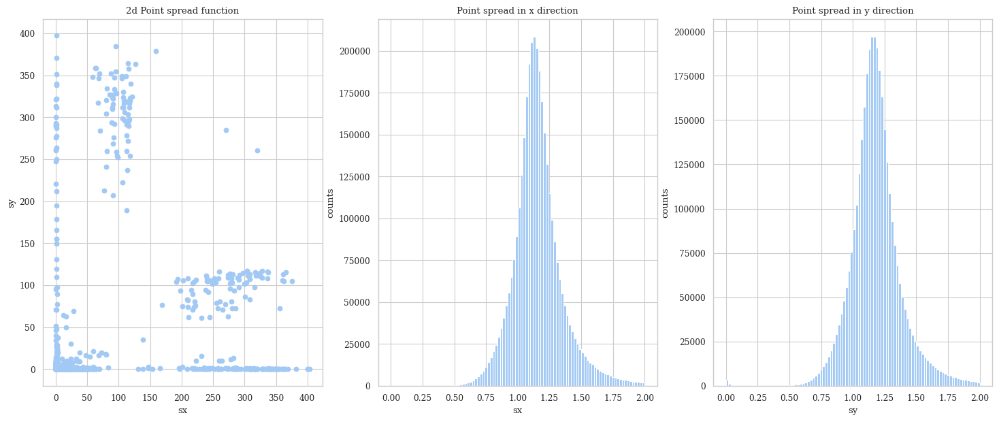

In [12]:
fig, axes = plt.subplots(nrows = 1,ncols =  3,figsize=(18, 7))
axes[0].scatter(locs.sx, locs.sy)
axes[0].set_title("2d Point spread function")
axes[0].set_xlabel("sx")
axes[0].set_ylabel("sy")
axes[1].hist(locs.sx, bins = 100, range=(0, 2))
axes[1].set_title("Point spread in x direction")
axes[1].set_xlabel("sx")
axes[1].set_ylabel("counts")
axes[2].hist(locs.sy, bins = 100, range=(0, 2))
axes[2].set_title("Point spread in y direction")
axes[2].set_xlabel("sy")
axes[2].set_ylabel("counts")
plt.show()

The point spread of a localization/blinking should be affected by photon noise as well and hence follow a poisson distribution.   

A very high point spread indicates an overlap of a localization with other blinking events. These localizations should be omitted since the subsequent fit would be biased.   

The omission limit is set to the double of the root of the mean ($2 \cdot \sqrt{N}$, remember that the standard deviation $\sigma$ of a poisson distribution is just $\sigma = \sqrt{N}$), but can be adjusted with the parameter below. This is justified by the normal distribution (a poisson distribution with a high count number takes similar shape of a normal distribution), where an area of two times the standard deviatopm still entails $\approx 95$% of the data. **Note that only values that exceed that limit should be omitted. Point spreads with a low value should not be omitted, since they yield precise fitting estimates.**

Text(0, 0.5, 'sy')

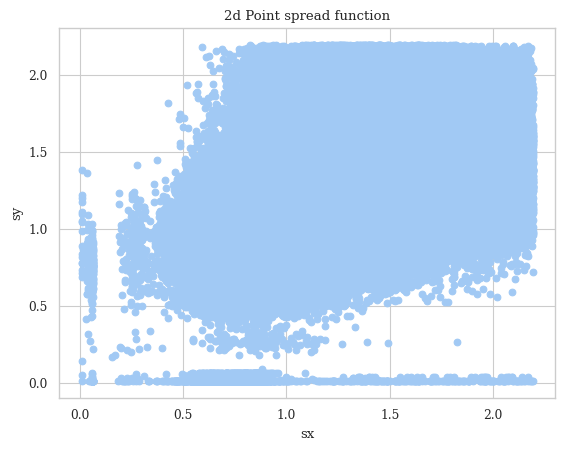

In [13]:
# Max. value for point spread
mean = 1.130
omissionLimit = mean +  np.sqrt(mean)

filtered_sx_sy_locs = locs[(locs["sx"] < omissionLimit) & (locs["sy"] < omissionLimit)]
######## activate the following lines if you want to see the point spread dist. after filtering ################
plt.scatter(filtered_sx_sy_locs.sx, filtered_sx_sy_locs.sy)
plt.title("2d Point spread function")
plt.xlabel("sx")
plt.ylabel("sy")

### Filtering out fits with high uncertainty

Every implemented fitting algorithm in Picasso (i.e. MLE, Least squares, Average of ROI) also provides two precision parameters of the fit ($\textit{lpx}$, $\textit{lpy}$), i.e. the standard deviation of the estimate $\sigma_{\text{estimate}}$ for x and y position calculated by the fitting algorithm.

Distribution of the $\sigma_{\text{estimate}}$ :

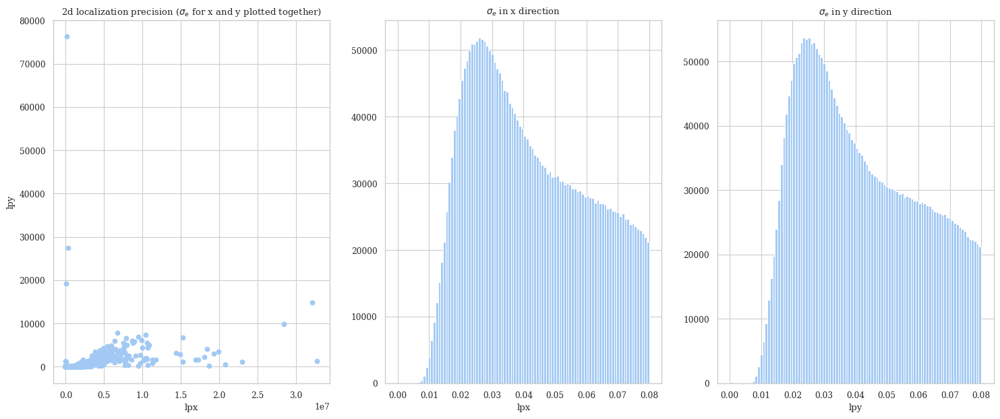

In [14]:
fig, axes = plt.subplots(nrows = 1,ncols =  3,figsize=(18, 7))
axes[0].scatter(filtered_sx_sy_locs.lpx, filtered_sx_sy_locs.lpy)
axes[0].set_title("2d localization precision ($\sigma_{e}$ for x and y plotted together)")
axes[0].set_xlabel("lpx")
axes[0].set_ylabel("lpy")
axes[1].hist(filtered_sx_sy_locs.lpx, bins = 100, range=(0, 0.08))
axes[1].set_title("$\sigma_{e}$ in x direction")
axes[1].set_xlabel("lpx")
axes[2].hist(filtered_sx_sy_locs.lpy, bins = 100, range=(0, 0.08))
axes[2].set_title("$\sigma_{e}$ in y direction")
axes[2].set_xlabel("lpy")
plt.show()

The data should show a similar poisson distribbution as the point spread fucntion due to the effects of photon noise.

Again the omission border is set to a multiple of the standard deviation (which for a poisson distribution is the squere root of the mean $N$, i.e. $\sigma = \sqrt{N}$) such that estimates with an extreme uncertain fit are omitted to enhance the final resolution quality. If you want to change the filtering limit adjust the parameter below.

Text(0, 0.5, 'lpy')

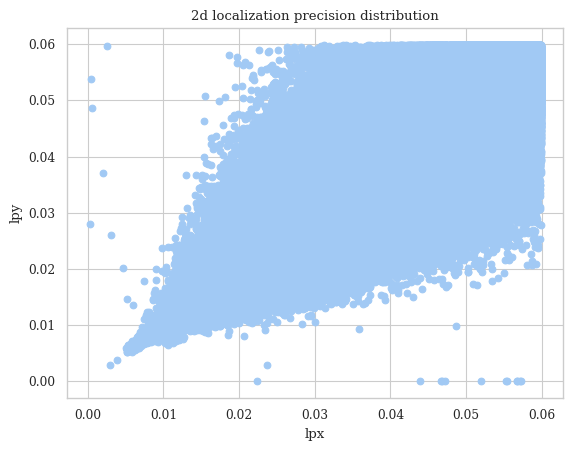

In [15]:
# Max. value for precision standard deviation
mean = 0.027
omissionLimit = mean + 0.2 * np.sqrt(mean)

################ activate the following line if you want to see the precision distr. after filtering ################
filtered_lpx_lpy_locs = filtered_sx_sy_locs[(filtered_sx_sy_locs["lpx"] < omissionLimit) & (filtered_sx_sy_locs["lpy"] < omissionLimit)]
plt.scatter(filtered_lpx_lpy_locs.lpx, filtered_lpx_lpy_locs.lpy)
plt.title("2d localization precision distribution")
plt.xlabel("lpx")
plt.ylabel("lpy")

### Filtering out isolated spots by further analyzing Photon count and net Gradient

In [16]:
# Renaming partially filtered data
data_filtered_for_precision = filtered_lpx_lpy_locs

What is the correlation between net Gradient and Photon count? :

Elapsed time: 258.5653 seconds


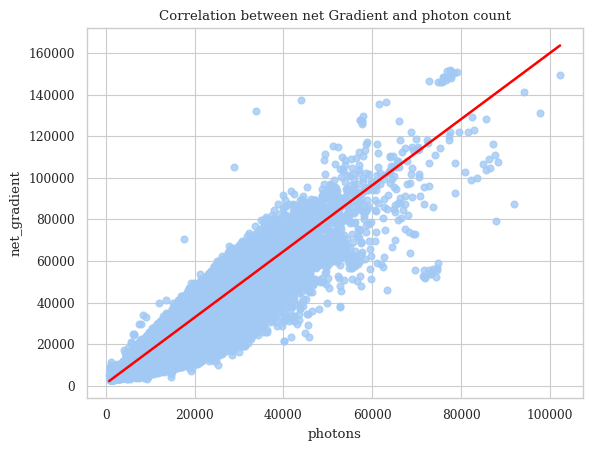

In [17]:
startTime = time.time()
sns.regplot(data= data_filtered_for_precision, x="photons", y="net_gradient", line_kws={"color": "red"})
plt.title('Correlation between net Gradient and photon count')
endTime = time.time()
elapsedTime = endTime - startTime
print(f"Elapsed time: {elapsedTime:.4f} seconds") # usually takes about 2-4 minutes depending on number of localizations

A linear trend should be observed, indicating that the net Gradient is directly proportional to the Photon count. This stems from the fact that a higher photon count reduces photon noise, effectively increasing contrast. Since contrast is measured by the net Gradient, higher counts should be proportional to higher contrast. **The linear trend confirms the reduction of photon noise via increased counts!**   
There are however outliers that clearly fall out of this trend.   

The basic idea for identifying isolated spots is as follows:    
A relatively small net Gradient (i.e. small contrast) for a relatively hight photon count indicates places of high functionalization density, since the neighbouring space of the spot must be bright. 
Vice versa, a relatively big net Gradient (i.e. high contrast) for a relatively low photon count indicates spots that are rather isolated.  

Isolated spots are unlikely to be caused by  docking strands that are part of the CNT structure or they at least distort the final image of the overall structure. Highly isolated spots (i.e. spots with high net Gradient while having a relatively low photon count) should therfore be omitted in order to create a better structural image.

To omit isolated spots the distribution of the regression residuals is calculated and a multiple of the standard deviation of the residuals is used to set the omission boundary (the boundary can be set in the first variable of the code below). The ommision boundary is again set to a multiple of the standard deviation of the residuals (assuming a normal distribution of net gradients for a given photon count):

Elapsed time: 228.6803 seconds


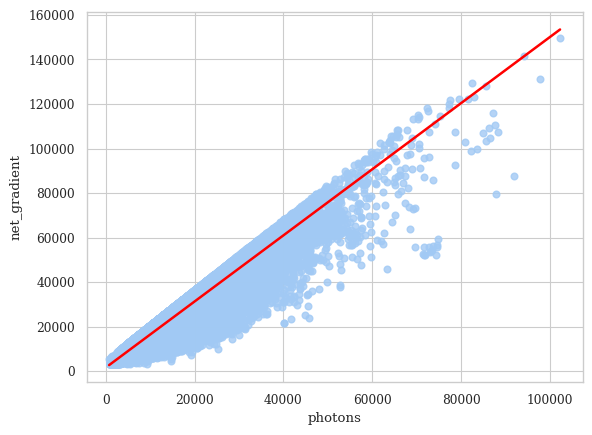

In [18]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression

# Setting the omission boundary by the standard deviation of the residuals (which is calculated below)
multipleOfTheStandardDeviOfResiduals = 1.5

# Fitting the linear regression model using the OLS Regression module from the scikit library
model = LinearRegression()  # Creates an instance of the linear regression class
X = data_filtered_for_precision["photons"].values.reshape(-1, 1)
y = data_filtered_for_precision["net_gradient"].values

# Calculating the regression
model.fit(X, y) 

# Calculating the predicted values by the linear regression model
y_predicted = model.predict(X) 

# Calculating the residuals
residuals = y - y_predicted

###### To optionally bound the values on both sides of the regression line, you can activate this line! ######
#residuals = np.abs(residuals) 

# Adding the residuals column to the DataFrame
data_filtered_for_precision['residuals'] = residuals

# Setting the omission boundary as multiple standard deviations of the residuals
omissionBoundary = multipleOfTheStandardDeviOfResiduals * np.std(residuals)

# Filtering the data to exclude outliers
data_filtered_final = data_filtered_for_precision[data_filtered_for_precision['residuals'] < omissionBoundary]

# Plotting the filtered data
startTime = time.time()
sns.regplot(data= data_filtered_final, x="photons", y="net_gradient", line_kws={"color": "red"})
endTime = time.time()
elapsedTime = endTime - startTime
print(f"Elapsed time: {elapsedTime:.4f} seconds") # takes about 2-4 minutes depending on number of localizations

# An extra variable to use for examining localization density later on (can be ignored for now)
data_filtered_final_for_density_analysis = data_filtered_final

Recap of the photon count statistics:

In [19]:
coloumnsToDescribe = data_filtered_final[["photons"]]
pd.options.display.float_format = '{:.2f}'.format
result = coloumnsToDescribe.describe(percentiles = [0.95, 0.96, 0.97, 0.98, 0.99, 0.995, 1])
result.drop(index = "count", inplace = True)
print(result)

        photons
mean    7491.88
std     4355.54
min      781.33
50%     6398.95
95%    15459.56
96%    16442.21
97%    17771.35
98%    19819.09
99%    23634.80
99.5%  27568.07
100%  102285.69
max   102285.69


One should set the contrast maximum in the Render program accordingly, so that high photon count outliers don't distort the contrast of the image!

Filtering process overview:

In [20]:
print('{} localizations have been filtered out, which is {}% of the original data'.format(len(locs)-len(data_filtered_final), ((len(locs)-len(data_filtered_final))/len(locs))*100))
print('Localizations before filtering: {}, Localizations after filtering: {}.'.format(len(locs),len(data_filtered_final)))

1472267 localizations have been filtered out, which is 41.988184979169425% of the original data
Localizations before filtering: 3506384, Localizations after filtering: 2034117.


## 3. Creating the structural image from the filtered data

Does the postion data allow for reaccuring localizations?

In [21]:
# Counting localisations in the filtered data
print("The filtered localization data has " + str(data_filtered_final.shape[0]) + " localizations.")

# Counting unique localisations in the filtered data
location_counts = data_filtered_final.groupby(['x', 'y']).size().reset_index(name='count')
print("Of these localizations " + str(len(location_counts["count"])) + " are unique.")

The filtered localization data has 2034117 localizations.
Of these localizations 2034113 are unique.


The localization data contains exclusively unique localizations, since the precision of each localization goes to the 7th significant digit.     
However, since the fit precision on average is $ \approx0.03$ pixels, it makes sense to conjoin localizations that only differ at the second significant digit (or higher) to create a better structural image (In Picasso's Render, which displays all unique localizations, one can set a blur to get a similar effect).

The idea here is that spots, which differ only within the range of the fitting precision, originated from the same docking strand!

Conjoining the data:

In [22]:
data_filtered_final['x_truncated'] = data_filtered_final['x'].apply(lambda x: round(x, 1))
data_filtered_final['y_truncated'] = data_filtered_final['y'].apply(lambda y: round(y, 1))

# Group by the truncated values and count occurrences
grouped_locations = data_filtered_final.groupby(['x_truncated', 'y_truncated']).size().reset_index(name='count')
print(grouped_locations)
print("The number of localizations has been reduced from " + str(len(location_counts["count"])) + " to " + str(grouped_locations.shape[0]) + " localizations.")

         x_truncated  y_truncated  count
0               1.70       162.70      1
1               1.70       210.30      1
2               1.80       149.70      1
3               1.80       162.60      1
4               1.80       205.90      1
...              ...          ...    ...
1024619       476.00       397.30      3
1024620       476.00       397.40      2
1024621       476.00       397.60      1
1024622       476.10       116.00      1
1024623       476.10       253.40      1

[1024624 rows x 3 columns]
The number of localizations has been reduced from 2034113 to 1024624 localizations.


Creating the final image of the overal structure using the conjoined locations:

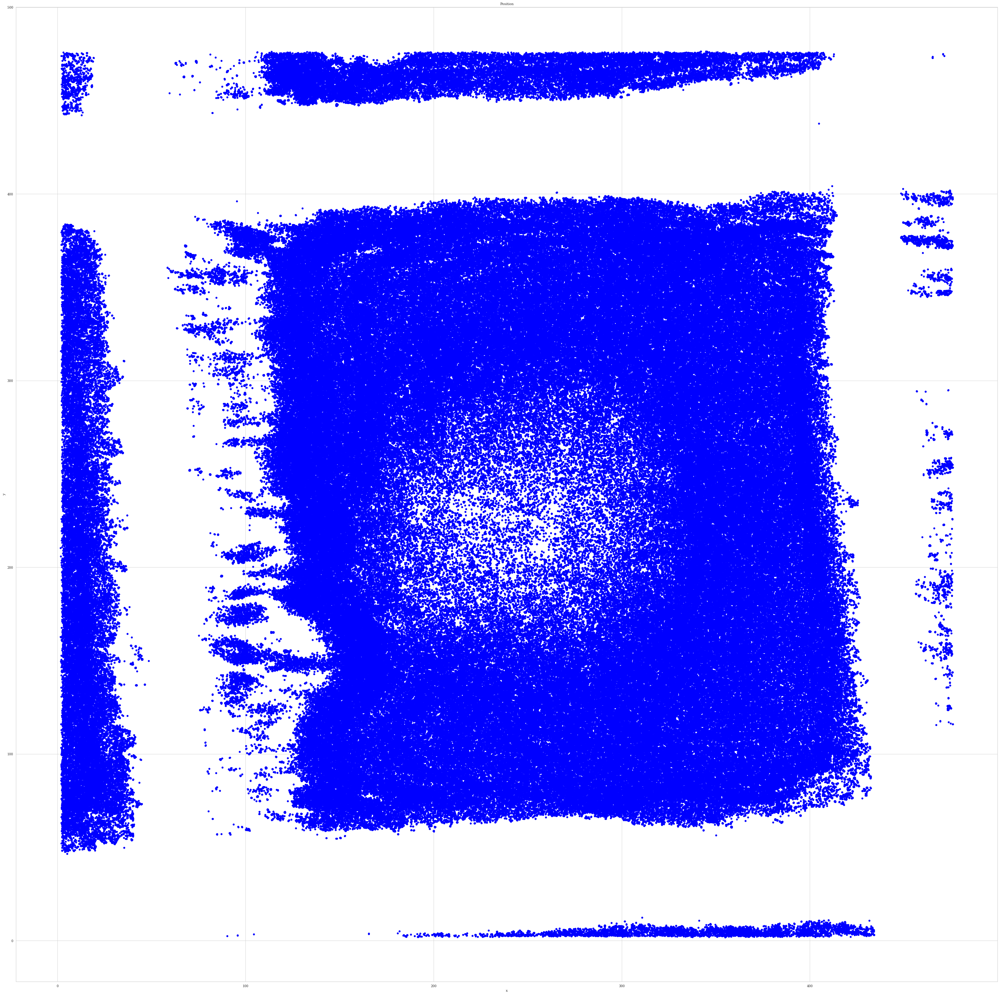

In [23]:
plt.figure(figsize=(50, 50))

x_positions = grouped_locations["x_truncated"]
y_positions = grouped_locations["y_truncated"]

# Create the scatterplot
plt.scatter(x_positions, y_positions, label='Final_image', color='blue')

# Adding labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Position')

# Show the plot
plt.savefig('final_image.png', format='png')

Zooming into a region of interest (ROI):

Specify the ROI by stating the x- and y-range of the grid:

In [24]:
# Specify the region you want to zoom in
# e.g. (200-300, 100-200)
x_min = 200
x_max = 280
y_min = 100
y_max = 180

final_image_zoomed_into_ROI_x200-280_y100-180.png


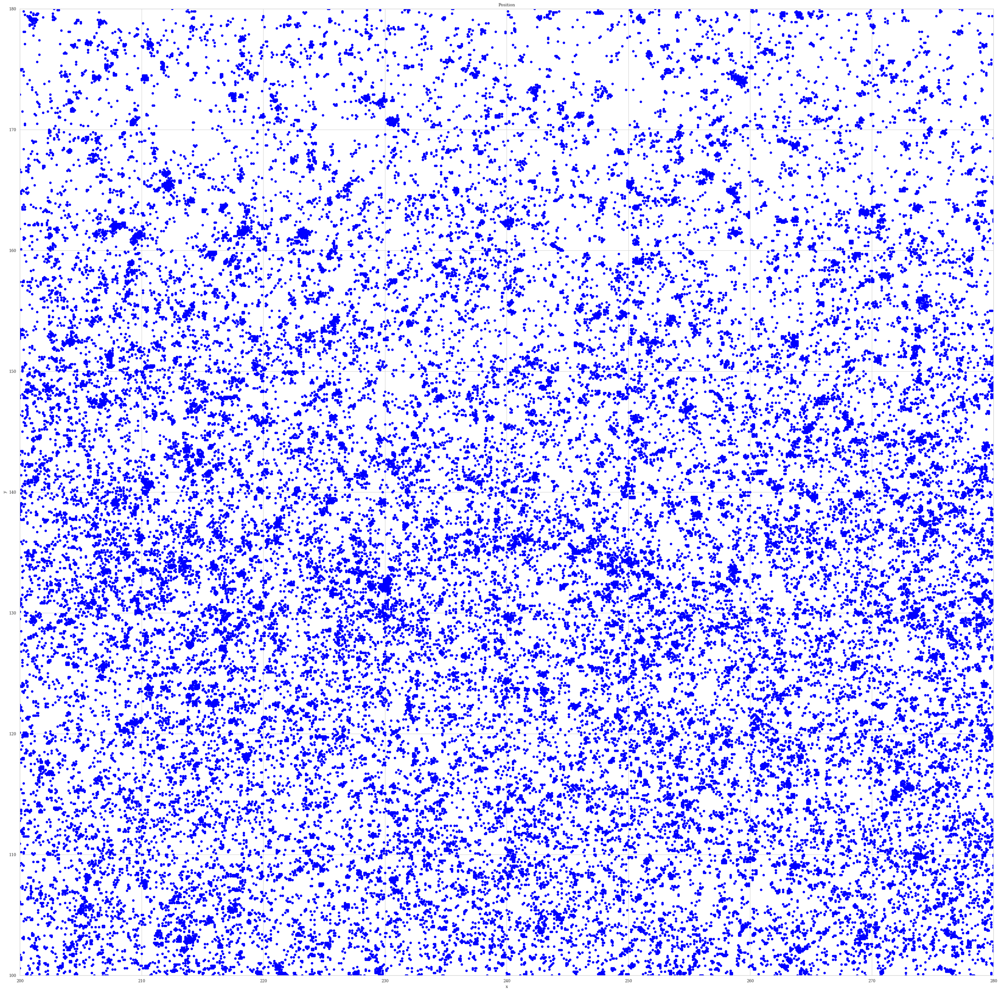

In [25]:
plt.figure(figsize=(40, 40))

x_positions = grouped_locations["x_truncated"]
y_positions = grouped_locations["y_truncated"]

# Create the scatterplot
plt.scatter(x_positions, y_positions, label='Final_image (with filtered data)', color='blue')


# The ROI
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

# Adding labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Position')

# Show the plot
saving_file = 'final_image_zoomed_into_ROI_x{}_y{}.png'.format(str(x_min) + "-" + str(x_max),str(y_min) + "-" + str(y_max))
print(saving_file)
plt.savefig(saving_file, format='png') # Saving the image into a png file

(Idea for better resolution of the tubular structure: Connecting dots with their nearest neighbors?)

To view the impact of the filtering on the image quality, compare the image above to the one below, which uses the unfiltered data as red dots:

final_image_zoomed_into_ROI_x200-280_y100-180.png


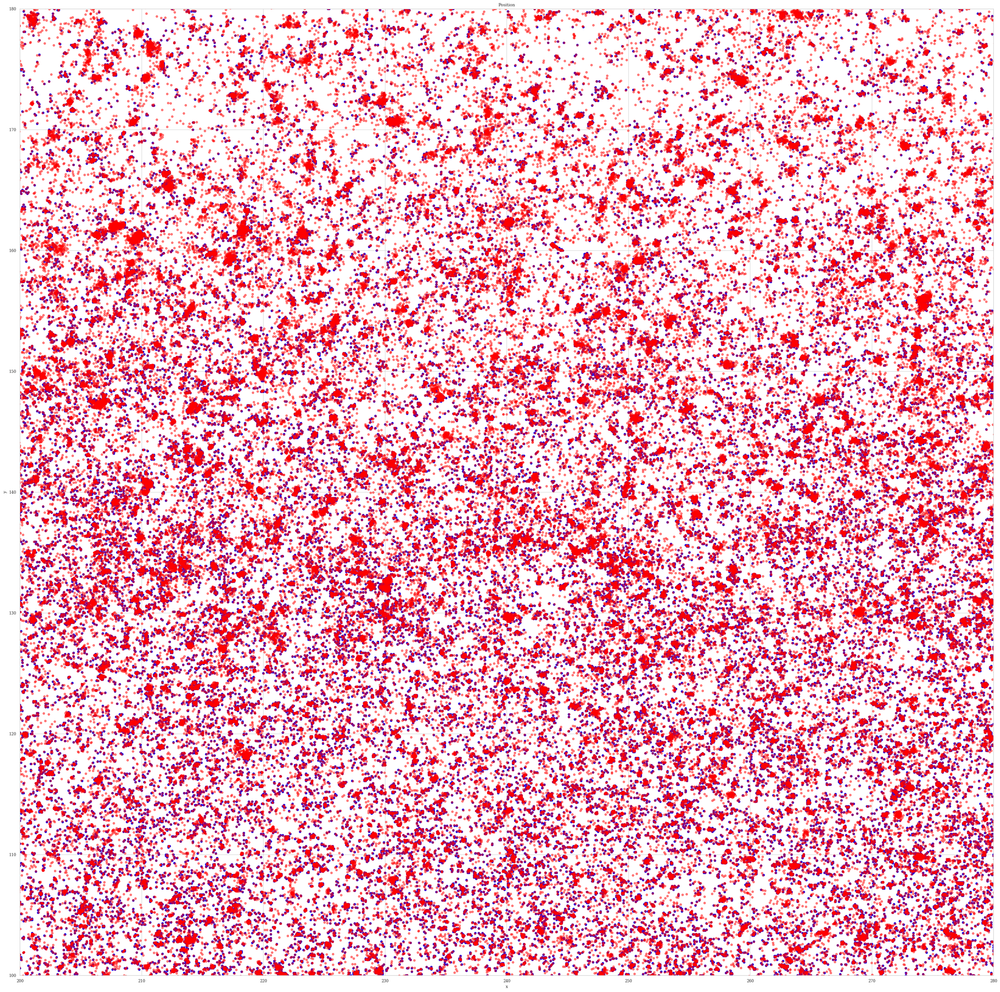

In [27]:
plt.figure(figsize=(40, 40))

x_positions = grouped_locations["x_truncated"]
y_positions = grouped_locations["y_truncated"]

# Create the scatterplot
plt.scatter(x_positions, y_positions, label='Final_image (with filtered data)', color='blue')
plt.scatter(locs["x"], locs["y"], label='Final_image (with unfiltered data)', color='red', alpha=0.5)

# The ROI
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

# Adding labels and title
plt.xlabel('x')
plt.ylabel('y')
plt.title('Position')

# Show the plot
saving_file = 'final_image_zoomed_into_ROI_x{}_y{}.png'.format(str(x_min) + "-" + str(x_max),str(y_min) + "-" + str(y_max))
print(saving_file)
plt.savefig(saving_file, format='png') # Saving the image into a png file

# 4. Rendering the final image via Picasso's Render program

Alternatively, for the final image creation the above filtered localization data can also be exported into the Picasso Render program.     
The program then creates the final image by creating a 2d scatterplot of localizations where the photon count determines the contrast.   

Transforming the filtered data (from its data frame format) back into a format that the Render program can process is a bit tricky tho.

To load the data into the Render program, the picasso python library must be used.    

To use the picasso library you need an Anaconda environment which uses a python 3.10 version. You then need to install the *picassosr* package in that environment to use the picasso functions. Unfortunately, since the *picassosr* package is dependent on older versions of numpy, matplotlib, etc. other packages (such as seaborn) may cause compatibility issues.    
For that reason one should use a different environment (i.e. the standard environment with all up to date packages) to analyze and filter the localization data and then load the filtered data in form of a record array into the notebook "WorkingWithThePicassoLibrary.pynb" which contains the *picassosr* package.
For more details on this see the other notebook.

The following code transforms the data frame of the localization data into a numpy *record array* since the picasso library takes the data as a record array for input.

First the added columns for the linear regression ("residuals") and the grouping ("x_truncated" and "y_truncated") that were added during the filtering steps must be removed again.

In [ ]:
data_filtered_final.head(5)

In [ ]:
data_filtered_final = data_filtered_final.drop(['residuals', 'x_truncated', 'y_truncated'], axis=1)

In [ ]:
data_filtered_final.head(5)

Converting the format of the filtered data:

In [ ]:
#Convert DataFrame to structured array
data_filtered_structured = data_filtered_final.to_records(index=False, column_dtypes = np.float32)

#Convert structured array to recarray
data_filtered_recarray = data_filtered_structured.view(type = np.recarray)

print(data_filtered_structured)

The following recarray (in form of a csv file) can now be imported in the other notebook:

In [ ]:
# Saving the recarray as a csv file
np.savetxt('data_filtered_recarray.csv', data_filtered_structured, delimiter=',', fmt=['%d', '%.8f', '%.8f','%.8f','%.8f','%.8f','%.8f','%.8f','%.8f','%.8f','%.8f'])

The following images compare the final images from the scatterplot and Picasso's Render program. Notice the additional contrast setting regarding the photon count in the Render program.

In [ ]:
import matplotlib.image as mpimg
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
img1 = mpimg.imread(saving_file) # The scatterplot image
img2 = mpimg.imread("C:/Users/mariu/Desktop/Picasso/picasso_image.png") # The image from the render program
ax1.imshow(img1)
ax1.axis('off')
ax1.set_title("Final image created in this document")
ax2.imshow(img2)
ax2.axis('off')
ax2.set_title("Final image by Picasso Render")
plt.show()

## Functionalisation density: Average distance between Localizations

To get an impression on the functionalization density (i.e. the spacial distance of docking strands) we calculate the average spacial distance of localizations. Note that we use the conjoined data here:

In [28]:
from scipy.spatial import KDTree
# Converting pixels into nm
rangeOfOnePixelInNanometers = 130

#Create a KDTree from the coordinates
#To use the unconjoined data use the variable: data_filtered_final_for_density_analysis
coords = data_filtered_final[['x', 'y']].values
tree = KDTree(coords)

#Find the nearest neighbor for each localization (excluding the localization itself)
distances, _ = tree.query(coords, k=2)  # k=2 to include the localization itself and its nearest neighbor

#Extract the distances to the nearest neighbor (ignoring the first column which is the distance to itself)
nearest_distances = distances[:, 1]

#Calculate the average free radius
average_free_distance = np.mean(nearest_distances)

print("The average distance of a localization to the next localization is " + str(average_free_distance * rangeOfOnePixelInNanometers) + " nm.")


The average distance of a localization to the next localization is 8.404287199230913 nm.
